In [1]:
import numpy as np
import os
import matplotlib.pyplot as plt
import cv2

# Read Images

In [2]:
from skimage import io

In [3]:
def read_images(imgdir:str)->dict:
    images = {}
    try:
        for file in os.listdir(imgdir):
            fname = file.split('.')[0]
            bgr = cv2.imread(os.path.join(imgdir, file))
            images[fname] = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
        return images
    
    except FileNotFoundError:
        print('Invalid path')

# Display

In [4]:
def show_all(imgs:dict, subrowcols:tuple=(6,3), size:tuple=(15, 30), use_gray:bool=True)->None:
    fig, axs = plt.subplots(subrowcols[0], subrowcols[1], figsize=size) # buat figur
    imgs_k = list(imgs.keys())
    imgs_v = list(imgs.values())
    h = 0
    for i in range(subrowcols[0]):
        for j in range(subrowcols[1]):
            axs[i, j].imshow(imgs_v[h], 'gray' if use_gray else None)
            axs[i, j].set_title(imgs_k[h])
            h+=1
            
def save_all(imgs:dict, suptitle:str, save_dir:str, subrowcols:tuple=(6,3), size:tuple=(15, 30), use_gray:bool=True)->None:
    fig, axs = plt.subplots(subrowcols[0], subrowcols[1], figsize=size) # buat figur
    imgs_k = list(imgs.keys())
    imgs_v = list(imgs.values())
    h = 0
    for i in range(subrowcols[0]):
        for j in range(subrowcols[1]):
            axs[i, j].imshow(imgs_v[h], 'gray' if use_gray else None)
            axs[i, j].set_title(imgs_k[h])
            h+=1
    fig.suptitle(suptitle)
    fig.savefig(save_dir, bbox_inches='tight')
    print(f'sucessfully saved at {save_dir}') 

# Process

In [5]:
from skimage import color

In [29]:
from skimage import exposure
from scipy.ndimage import gaussian_filter
from skimage import img_as_float
from skimage import morphology
from skimage import filters
from skimage import segmentation

## Grayscaling

In [7]:
def all_to_gray(imgs:dict)->dict:
    grays = {}
    for img in imgs:
        # grays[img] = color.rgb2gray(imgs[img])
        grays[img] = cv2.cvtColor(imgs[img], cv2.COLOR_RGB2GRAY)
    return grays

## Preprocessing: Contrast Stretching

In [27]:
def preprocess(imgs:dict)->dict:
    prepd = {}
    # p = {} # hanya untuk debugging
    
    for img in imgs:
        prepd[img] = exposure.rescale_intensity(imgs[img], in_range=(100, 255))
    # show_all(p, use_gray=True) # hanya untuk debugging
    return prepd

## Segmentation: Regional Maxima

In [9]:
def segment_holes(gray_imgs:dict, rgb_imgs:dict)->tuple[dict, dict]:
    binary_res = {}
    labelled_res = {}
    for img in gray_imgs:
        # ubah int -> float
        float_img = img_as_float(gray_imgs[img])
        # gaussian blur
        gauss_blur = gaussian_filter(float_img, 3)
        # reconstruction
        seed = np.copy(gauss_blur)
        seed[1:-1, 1:-1] = gauss_blur.min()
        mask = gauss_blur
        
        dilation = morphology.reconstruction(seed, mask, method='dilation')
        subtr = gauss_blur - dilation
        thresh_value = filters.threshold_isodata(subtr)
        binary = subtr > thresh_value
        minimal_noise = morphology.remove_small_objects(binary, 515, connectivity=1)
        binary_res[img] = minimal_noise
        labelled = color.label2rgb(label=minimal_noise, image=rgb_imgs[img], colors=[(1, 0, 0)], \
                                   alpha=0.5, bg_label=0, bg_color=None)
        labelled_res[img] = labelled
    # show_all(results) # hanya untuk debugging
    return binary_res, labelled_res

## Segmentation: Another

In [68]:
def find_holes(gray:dict, origin:dict) -> tuple[dict, dict]:
    display = {}
    
    for g in gray:
        display[g] = gray[g]
    show_all(display, use_gray=True)
    return {}, {}

# Main

In [11]:
IMAGES_DIR = '/home/tsdhrm/Pictures/PotholesGroupedCropped'

In [12]:
images = read_images(imgdir=IMAGES_DIR)

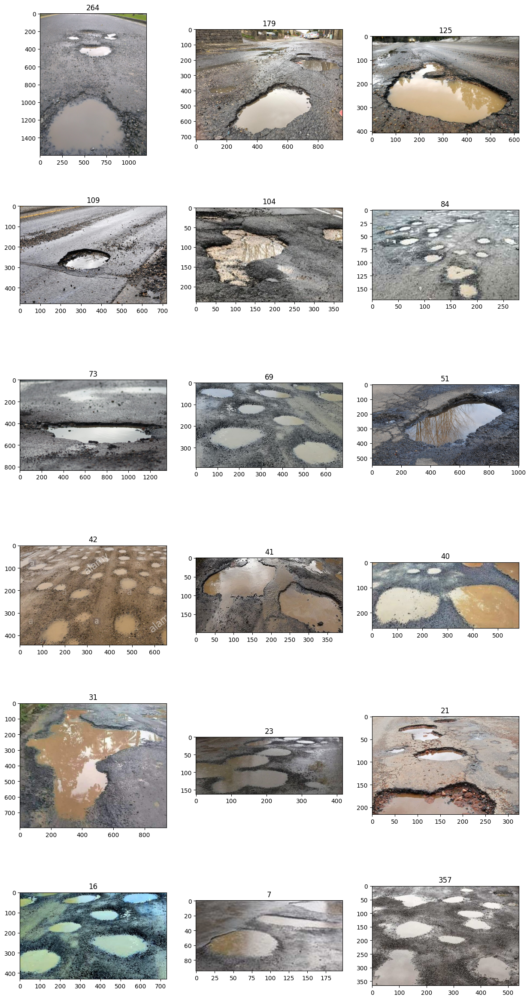

In [13]:
show_all(images)

In [14]:
gray_imgs = all_to_gray(images)

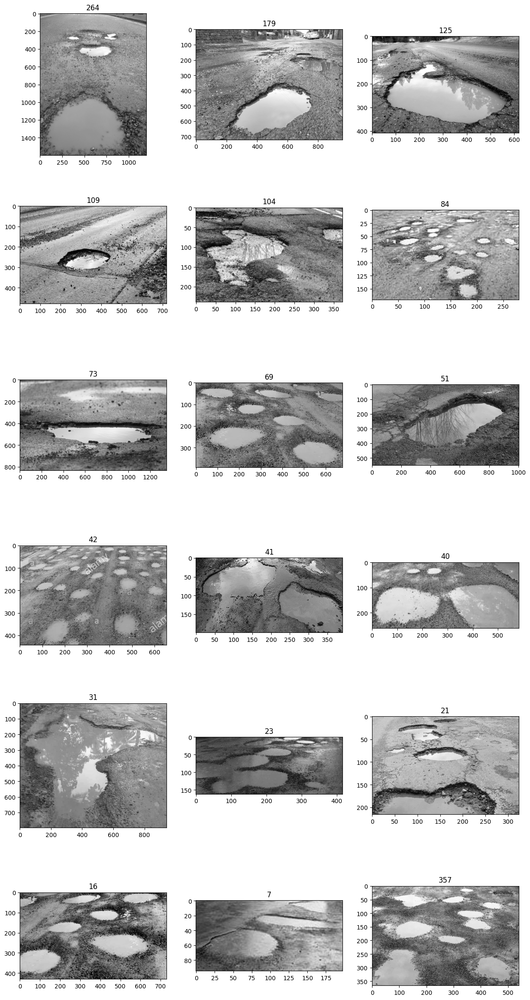

In [15]:
show_all(gray_imgs, use_gray=True)

## Preprocessing

In [16]:
pre = preprocess(gray_imgs)

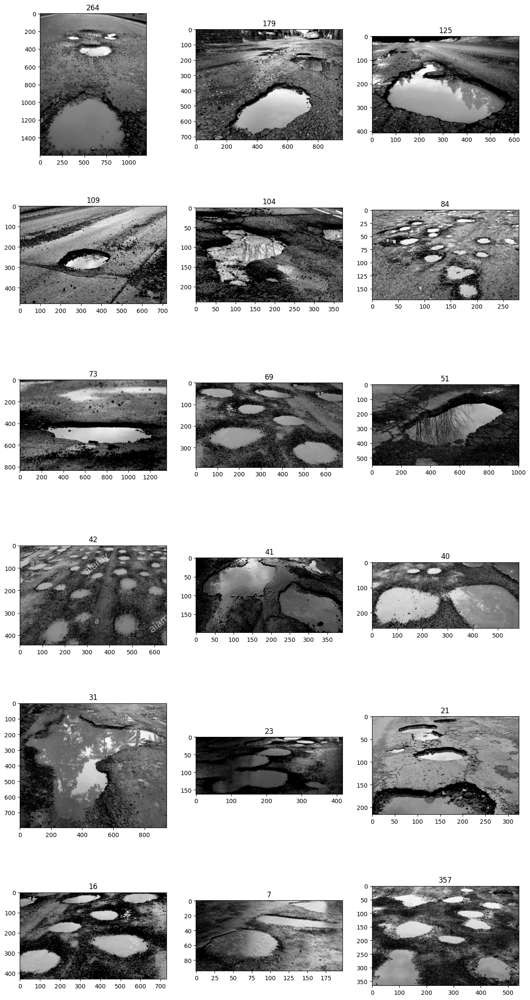

In [17]:
show_all(pre)

## Segmentation

In [71]:
masks, labelled = segment_holes(pre, images)

In [70]:
# masks, labelled = find_holes(pre, images)

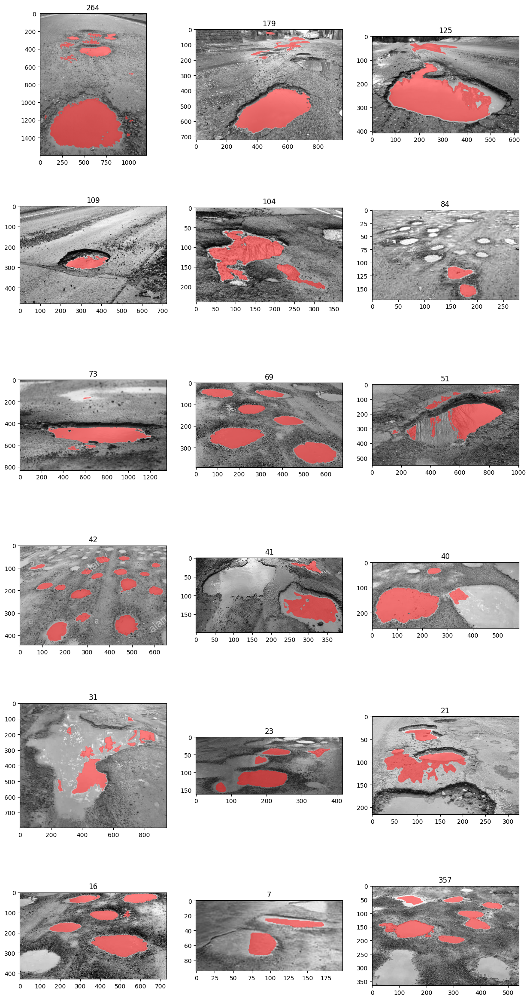

In [72]:
show_all(labelled, use_gray=False)

In [21]:
# save_all(labelled, 'Maxima Reconstruction', '/home/tsdhrm/Pictures/Screenshots/hasil_1.png')